In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
#importing libraries
import os
import random
import cv2 as cv
import datetime as dt
from collections import deque
# from moviepy.editor import *
# Computation
import numpy as np
# visualization
import matplotlib.pyplot as plt
%matplotlib inline
# machine leanring
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical,plot_model

### Now we r setting seed for the consistent result.


In [11]:
seedConsistent = 27
np.random.seed(seedConsistent)
random.seed(seedConsistent)
tf.random.set_seed(seedConsistent)

In [ ]:
%%capture
!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

#extracting the dataset
!unrar x UCF50.rar /content/drive/MyDrive/Cohort8/CapstoneProject/Datasets

Showing the 20 Random categories from the dataset

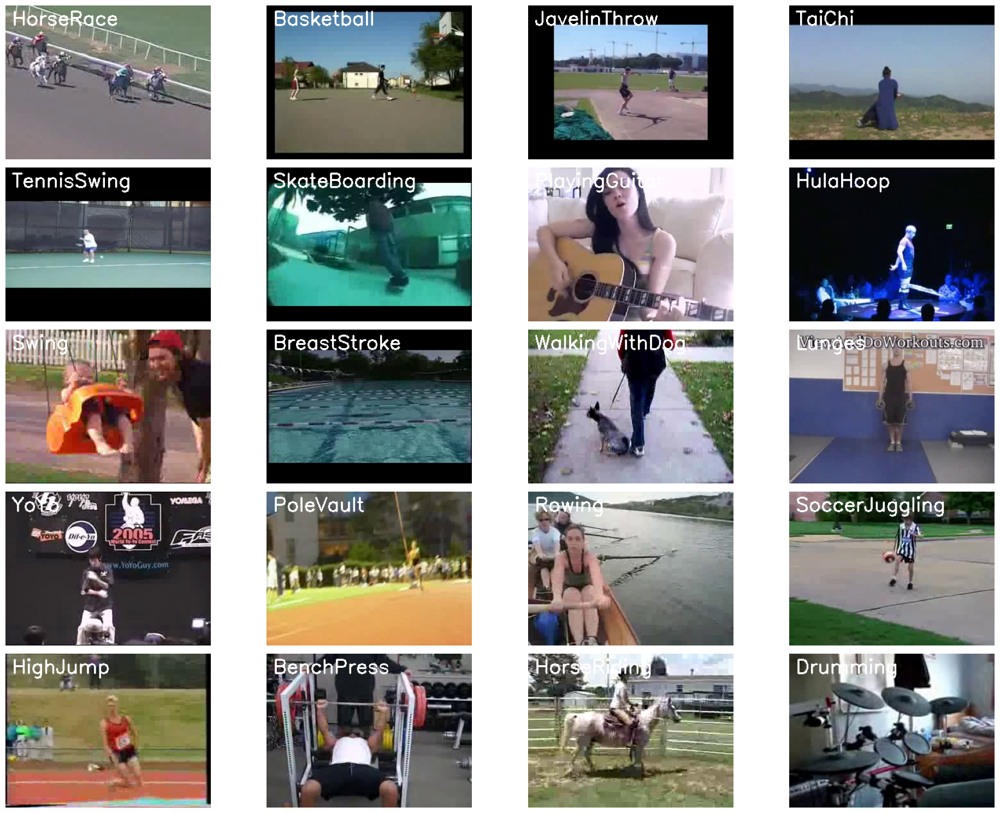

In [ ]:
# Number of rows and columns
num_cols = 4
num_rows = 5  # adjusting the grid for desired shape
total_images = num_cols * num_rows

# Create the figure
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Get the names of all classes
classesNames = os.listdir('/content/drive/MyDrive/Cohort8/CapstoneProject/Datasets/UCF50')

# Generate 20 random indices
randomRange = random.sample(range(len(classesNames)), total_images)

# Iterate through all generated random values
for counter, (random_index, ax) in enumerate(zip(randomRange, axes.flatten()), 1):
    # Class name
    className = classesNames[random_index]

    # Retrieve the list of all video files
    videoFolderPath = f'/content/drive/MyDrive/Cohort8/CapstoneProject/Datasets/UCF50/{className}'
    VideoFileNameList = os.listdir(videoFolderPath)
    if not VideoFileNameList:
        print(f"No videos found in folder: {className}")
        ax.axis('off')
        continue

    # Randomly select a video
    selectedVideoFileName = random.choice(VideoFileNameList)

    # Initialize a VideoCapture
    videoFilePath = f'{videoFolderPath}/{selectedVideoFileName}'
    videoReader = cv.VideoCapture(videoFilePath)

    # Read the first frame of the video file
    success, bgrFrame = videoReader.read()
    videoReader.release()

    if not success:
        print(f"Failed to read video: {selectedVideoFileName}")
        ax.axis('off')
        continue

    # Convert frame from BGR to RGB format
    rgbFormat = cv.cvtColor(bgrFrame, cv.COLOR_BGR2RGB)

    # Write the class name on the video frame
    cv.putText(rgbFormat, className, (10, 30), cv.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # Display the image
    ax.imshow(rgbFormat)
    ax.axis('off')

# Remove unused axes if the total images don't fill the grid
for i in range(counter, num_rows * num_cols):
    axes.flatten()[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

### **Now Preprocess the Dataset**

Next, we will perform some preprocessing on the dataset. First, we will read the video files from the dataset and resize the frame of the videos to a fixed width and height, to reduce the computatution let's normalized the data which make the covergence faster

In [ ]:
# first apply some constraints
imageHeight, imageWidth = 64,64
# sequence length that will fed as one sequence
sequenceLength = 20
# dataset Directory path
# datasetDir = '/content/drive/MyDrive/Cohort8/CapstoneProject/Datasets/UCF50'

# classes list that would be used for the training
classesList = os.listdir(datasetDir)[:10]

## **Creating the Function to Extract, Resize and Normalize**

we will create a function framesExtraction that will create a list containing the resized and normalized frames of a video whose path is passed to it as an argument. The function
will read the video file frame by frame, although not all frame are added to the list as we will only need an evenly distributed sequence length of frames.

In [ ]:
def framesExtraction(videoPath):
  # this function will extract the frames from the video nd extract them in to a framesList
    framesList = []
    videoReader = cv.VideoCapture(videoPath)
    videoFramesCount = int(videoReader.get(cv.CAP_PROP_FRAME_COUNT))
    skipFramesWindow = max(int(videoFramesCount / sequenceLength), 1)

    for frameCounter in range(sequenceLength):
        videoReader.set(cv.CAP_PROP_POS_FRAMES, frameCounter * skipFramesWindow)

        success, frame = videoReader.read()
        if not success:
            break

        resizedFrame = cv.resize(frame, (imageHeight, imageWidth))
        normalizedFrame = resizedFrame / 255.0
        framesList.append(normalizedFrame)

    videoReader.release()
    return framesList


In [ ]:
# creating Function for the DataSet
def createDataset():
  # this function will create the dataset for me like the features, labels, videoFilepaths
  features = []
  labels = []
  videoFilesPaths = []

  for classIndex,className in enumerate(classesList):
    print(f'Extracting Data of the Class: {className}')
    # getting the list of the class for the current class
    filesList = os.listdir(os.path.join(datasetDir,className))

    for fileName in filesList:
      # getting the list of the videos
      videoFilePath = os.path.join(datasetDir,className,fileName)
      frames = framesExtraction(videoFilePath)

      if len(frames) == sequenceLength:
        features.append(frames)
        labels.append(classIndex)
        videoFilesPaths.append(videoFilePath)

  features = np.asarray(features)
  lables = np.array(labels)

  return features , labels , videoFilesPaths

In [ ]:
# creating the dataset
features, labels , videoFilePaths = createDataset()

Extracting Data of the Class: MilitaryParade
Extracting Data of the Class: Mixing
Extracting Data of the Class: Nunchucks
Extracting Data of the Class: PizzaTossing
Extracting Data of the Class: PlayingGuitar
Extracting Data of the Class: PlayingPiano
Extracting Data of the Class: PlayingViolin
Extracting Data of the Class: PullUps
Extracting Data of the Class: Punch
Extracting Data of the Class: RockClimbingIndoor


# **Doing the Encoding thing**

In [ ]:
# coverting the labels into one hot encoding
oneHotEncodingLabels = to_categorical(labels)

# **Now Split the data :)**

In [ ]:
featuresTrain, featuresTest, labelsTrain, labelsTest = train_test_split(features,
                                                                        oneHotEncodingLabels,
                                                                        test_size = 0.2,
                                                                        shuffle=True,random_state=seedConsistent)

# **New Model**

In [17]:
def createLRCN():
    
    model = Sequential()

    # Convolutional layers with TimeDistributed
    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same', activation='relu'),
                               input_shape=(sequenceLength, imageHeight, imageWidth, 3)))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))  # Reduced pooling size
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same', activation='relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))  # Reduced pooling size
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same', activation='relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))  # Reduced pooling size
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same', activation='relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))  # Reduced pooling size
    model.add(TimeDistributed(Dropout(0.25)))

    # Flatten and LSTM layers
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(32))

    # Dense layer with softmax activation for classification
    model.add(Dense(len(classesList), activation='softmax'))

    # Print model summary
    model.summary()

    return model


In [18]:
LRCN = createLRCN()
print('Model created Successfully')

c:\Users\HAFIZ COMPUTER\anaconda\envs\deep\lib\site-packages\keras\src\layers\core\wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_13             │ (None, 20, 64, 64, 16) │           448 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_14             │ (None, 20, 32, 32, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_15             │ (None, 20, 32, 32, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_16             │ (None, 20, 32, 32, 32) │         4,640 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_17             │ (None, 20, 16, 16, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_18             │ (None, 20, 16, 16, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_19             │ (None, 20, 16, 16, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_20             │ (None, 20, 8, 8, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_21             │ (None, 20, 8, 8, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_22             │ (None, 20, 8, 8, 64)   │        36,928 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_23             │ (None, 20, 4, 4, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_24             │ (None, 20, 4, 4, 64)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_25             │ (None, 20, 1024)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32)             │       135,296 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │           330 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 196,138 (766.16 KB)

 Trainable params: 196,138 (766.16 KB)

 Non-trainable params: 0 (0.00 B)

Model created Successfully


# **Let's Visualize our model**

In [20]:
%pip install pydot

Note: you may need to restart the kernel to use updated packages.


In [24]:
%pip install pydot graphviz

plot_model(LRCN, to_file = './assets/LRCN_structure_plot.png', show_shapes=True, show_layer_names=True)

Note: you may need to restart the kernel to use updated packages.
You must install pydot (`pip install pydot`) for `plot_model` to work.


In [ ]:
earlyStoppingCallback = EarlyStopping(monitor='val_loss',patience = 10, mode = 'min',restore_best_weights=True)

LRCN.compile(loss = 'categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])

ModelTrainingHistory = LRCN.fit(x=featuresTrain, y = labelsTrain, epochs = 20, batch_size=4,
                                          shuffle=True,validation_split=0.2,callbacks=[earlyStoppingCallback])

Epoch 1/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 34s 73ms/step - accuracy: 0.1568 - loss: 2.2600 - val_accuracy: 0.3208 - val_loss: 1.9510
Epoch 2/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - accuracy: 0.2799 - loss: 1.9564 - val_accuracy: 0.3962 - val_loss: 1.7611
Epoch 3/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step - accuracy: 0.3978 - loss: 1.7357 - val_accuracy: 0.4434 - val_loss: 1.6892
Epoch 4/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step - accuracy: 0.2356 - loss: 2.1038 - val_accuracy: 0.4528 - val_loss: 1.5908
Epoch 5/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.4665 - loss: 1.6129 - val_accuracy: 0.5000 - val_loss: 1.4780
Epoch 6/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 20s 63ms/step - accuracy: 0.4993 - loss: 1.4603 - val_accuracy: 0.6226 - val_loss: 1.2146
Epoch 7/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step - accuracy: 0.5909 - loss: 1.1752 - val_accuracy: 0.6651 - val_loss: 1.0531
Epoch 8/20
212/212 ━━━━━━━━━━━━━━━━━━━━ 22s 68ms/step - accuracy: 0.6697 - loss: 1.0245 - 

In [ ]:
modelEvaluate = LRCN.evaluate(featuresTest,labelsTest)

9/9 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.8135 - loss: 0.5524


# **Saving the Model**

In [ ]:
# Evaluate the model and get loss and accuracy
modelEvaluateLoss, modelEvaluateAccuracy = modelEvaluate

# Define the date-time format for file naming
dateTimeFormat = '%y_%m_%d__%H_%M_%S'

# Get the current date and time
currentDateTimeDt = dt.datetime.now()

# Convert the current date and time to a formatted string
currentDateTimeString = dt.datetime.strftime(currentDateTimeDt, dateTimeFormat)

# Generate the model file name with loss and accuracy
modelFileName = f'./Models/LRCN__DateTime_{currentDateTimeString}___Loss_{modelEvaluateLoss}___Accuracy_{modelEvaluateAccuracy}.h5'

# Save the model with the generated file name
LRCN.save(modelFileName)


# **Plot the model Loss and Accuracy**

In [ ]:
def plotTrainingMetrics(modelTrainHistory, metricNameLoss, metricNameAccuracy, plotTitle):
    """
    Plots the loss and accuracy metrics from the training history.

    Parameters:
    - modelTrainHistory: The history object from model training.
    - metricNameLoss: The key for the loss metric in the history.
    - metricNameAccuracy: The key for the accuracy metric in the history.
    - plotTitle: The title for the plot.
    """
    # Extract metrics from training history
    trainingLoss = modelTrainHistory.history[metricNameLoss]
    validationLoss = modelTrainHistory.history[f'val_{metricNameLoss}']
    trainingAccuracy = modelTrainHistory.history[metricNameAccuracy]
    validationAccuracy = modelTrainHistory.history[f'val_{metricNameAccuracy}']

    # Create subplots for loss and accuracy
    plt.figure(figsize=(12, 6))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(trainingLoss, label='Training Loss', color='blue')
    plt.plot(validationLoss, label='Validation Loss', color='orange')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(trainingAccuracy, label='Training Accuracy', color='blue')
    plt.plot(validationAccuracy, label='Validation Accuracy', color='orange')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Add the overall title for the plots
    plt.suptitle(plotTitle, fontsize=16)
    plt.tight_layout()
    plt.show()


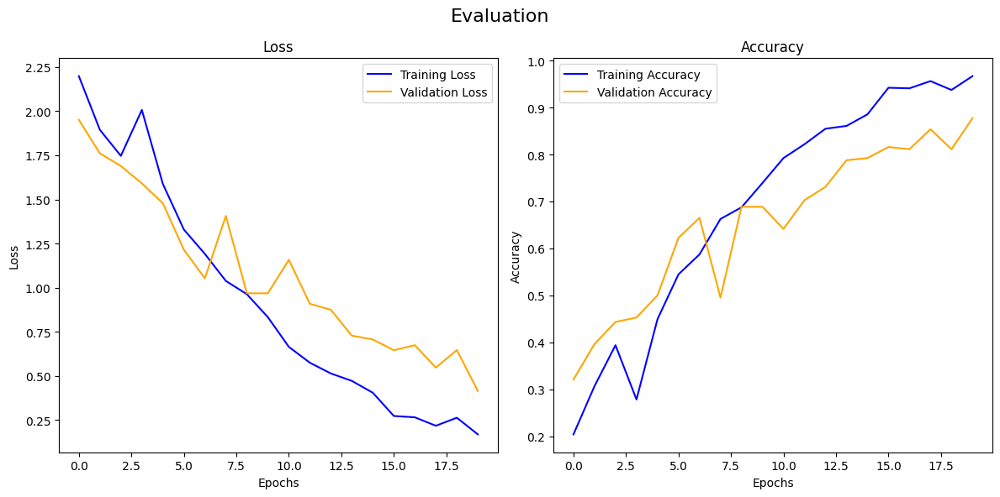

In [ ]:
plotTrainingMetrics(ModelTrainingHistory,'loss','accuracy','Evaluation')

# **Predicting the Model**

In [ ]:
# now predicting the video from the model
def predictTheVideo(videoFilePath, outputFilePath, sequenceLength):
    # Open the video file
    videoReader = cv.VideoCapture(videoFilePath)
    if not videoReader.isOpened():
        print("Error: Unable to open video file.")
        return

    # Get original video properties
    originalVideoWidth = int(videoReader.get(cv.CAP_PROP_FRAME_WIDTH))
    originalVideoHeight = int(videoReader.get(cv.CAP_PROP_FRAME_HEIGHT))
    fps = int(videoReader.get(cv.CAP_PROP_FPS))

    # Initialize video writer
    videoWriter = cv.VideoWriter(
        outputFilePath,
        cv.VideoWriter_fourcc(*'mp4v'),  # Codec for .mp4 files
        fps,
        (originalVideoWidth, originalVideoHeight)
    )

    # Queue for storing frames
    framesQueue = deque(maxlen=sequenceLength)
    predictedClassName = ''

    # Read video frame by frame
    while videoReader.isOpened():
        ok, frame = videoReader.read()
        if not ok:
            break

        # Resize the frame to model input size
        resizedFrame = cv.resize(frame, (imageWidth, imageHeight))

        # Normalize the frame
        normalizedFrame = resizedFrame / 255.0

        # Append the normalized frame to the queue
        framesQueue.append(normalizedFrame)

        # If the queue is full, make a prediction
        if len(framesQueue) == sequenceLength:
            # Prepare frames for prediction
            inputFrames = np.expand_dims(framesQueue, axis=0)  # Shape: (1, sequenceLength, imageHeight, imageWidth, 3)

            # Predict the probabilities for each class
            predictedLabelsProbabilities = LRCN.predict(inputFrames)[0]

            # Get the label with the highest probability
            predictedLabel = np.argmax(predictedLabelsProbabilities)
            predictedClassName = classesList[predictedLabel]

        # Add the predicted class name as text on the frame
        cv.putText(frame, predictedClassName, (10, 50), cv.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # Write the frame to the output video
        videoWriter.write(frame)

    # Release resources
    videoReader.release()
    videoWriter.release()
    print(f"Video with predictions saved to: {outputFilePath}")


# **Prediction 1**

In [ ]:
outputVideoPath = f'/content/drive/MyDrive/Cohort8/CapstoneProject/videoFuck.mp4'
inputVideoPath = '/content/drive/MyDrive/Cohort8/CapstoneProject/Datasets/UCF50/PizzaTossing/v_PizzaTossing_g01_c03.avi'
predictTheVideo(inputVideoPath,outputVideoPath,sequenceLength)
VideoFileClip(outputVideoPath,audio=False,target_resolution=(300,None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

Moviepy - Done !
Moviepy - video ready __temp__.mp4


# **Prediction 2**

In [ ]:
outputVideoPath = f'/content/drive/MyDrive/Cohort8/CapstoneProject/videoFuck.mp4'
inputVideoPath = '/content/drive/MyDrive/Cohort8/CapstoneProject/Datasets/UCF50/MilitaryParade/v_MilitaryParade_g01_c04.avi'
predictTheVideo(inputVideoPath,outputVideoPath,sequenceLength)
VideoFileClip(outputVideoPath,audio=False,target_resolution=(300,None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

Moviepy - Done !
Moviepy - video ready __temp__.mp4


# **Prediction 3**

In [ ]:
outputVideoPath = f'/content/drive/MyDrive/Cohort8/CapstoneProject/videoFuck.mp4'
inputVideoPath = '/content/v-playingguitar-g01-c04_ysfd6ADB.avi'
predictTheVideo(inputVideoPath,outputVideoPath,sequenceLength)
VideoFileClip(outputVideoPath,audio=False,target_resolution=(300,None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

Moviepy - Done !
Moviepy - video ready __temp__.mp4


# **Prediction 4**

In [ ]:
outputVideoPath = f'/content/drive/MyDrive/Cohort8/CapstoneProject/videoFuck.mp4'
inputVideoPath = '/content/v-mixing-g01-c04_Va7Fs9NM.avi'
predictTheVideo(inputVideoPath,outputVideoPath,sequenceLength)
VideoFileClip(outputVideoPath,audio=False,target_resolution=(300,None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━

Moviepy - Done !
Moviepy - video ready __temp__.mp4
